# Cell type labeling, plotting, and differential gene expression analysis

# Notebook setup

In [1]:
from itertools import chain
from itertools import product
import numpy as np
import anndata as ad
import pandas as pd
import scanpy as sc
import scanpy.external as sce
# import scvelo as scv
# import cellrank as cr
import seaborn as sns
from scipy import io
from scipy import sparse

In [18]:
import sc_toolbox as sctb

ModuleNotFoundError: No module named 'sc_toolbox'

In [3]:
import gc
gc.enable()

In [4]:
import os
os.chdir('/local/workdir/dwm269/scCardiacOrganoid/')

In [5]:
# Load metadata
meta = pd.read_csv("resources/metadata.csv")
meta = meta.loc[meta["source"]=="Hoang et al",]
meta = meta.loc[meta["include"],]
meta.index = list(range(0, len(meta)))
meta

,sample,include,data.dir,pattern,pattern_int,timepoint,time_int,cell_line,source,soupx,soupx_rho_GeneFull
0,D0_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D0,0,GCaMP6f hiPSCs,Hoang et al,False,NaN
1,D1_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D1,1,GCaMP6f hiPSCs,Hoang et al,False,NaN
2,D4_200um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.076
3,D4_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.070
4,D4_1000um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,1000um,1000.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.140
5,D6_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D6,6,GCaMP6f hiPSCs,Hoang et al,True,0.029
6,D8_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D8,8,GCaMP6f hiPSCs,Hoang et al,True,0.015
7,D12_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D12,12,GCaMP6f hiPSCs,Hoang et al,True,0.017
8,D21_200um_B,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.011
9,D21_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.039


## Load in preprocessed data

In [6]:
adata = sc.read_h5ad(
    filename="/workdir/dwm269/scCardiacOrganoid/pyobjs/ma_iPSC_v6names.h5ad"
)

# https://github.com/scverse/scanpy/issues/2239
adata.uns['log1p']["base"] = None 

In [7]:
adata.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96401 entries, AAACCCAAGTGCAACG to TTTGTTGTCTATGTGG
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   sample                      96401 non-null  category
 1   include                     96401 non-null  bool    
 2   data.dir                    96401 non-null  category
 3   pattern                     96401 non-null  category
 4   pattern_int                 96401 non-null  float64 
 5   timepoint                   96401 non-null  category
 6   time_int                    96401 non-null  float64 
 7   cell_line                   96401 non-null  category
 8   source                      96401 non-null  category
 9   soupx                       96401 non-null  bool    
 10  soupx_rho_GeneFull          75971 non-null  float64 
 11  n_genes                     96401 non-null  int64   
 12  n_counts                    96401 non-null  float32 


### Clustering summary plots

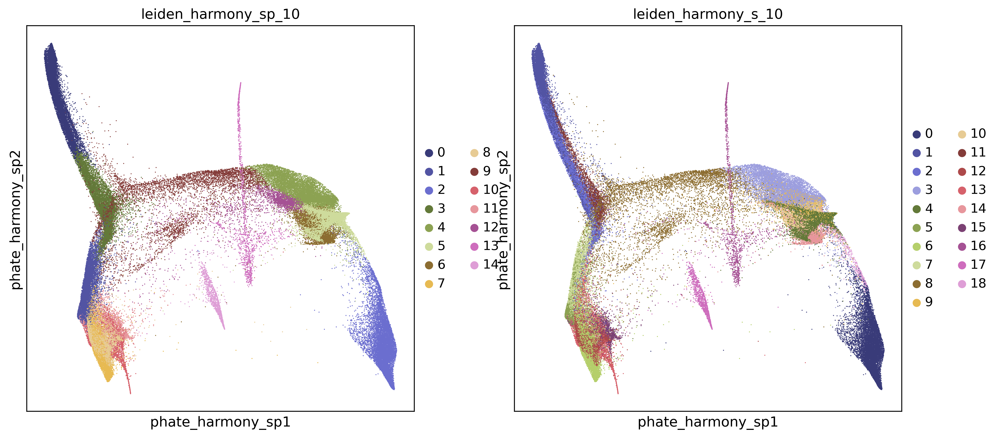

In [8]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=12,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    color=['leiden_harmony_sp_10', 'leiden_harmony_s_10'],  #'leiden_harmony',
#     color = ['APOA1','KDR', 'FAM184A','CDH2'],
#     color = ['GATA2','GATA3', 'GATA4','GATA6'],
#     color=['pattern_timepoint'],
#     edges=True, edges_width=0.01, 
#     edges=False, legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

# Annotate cell types

In [8]:
# import csv
# reader = csv.DictReader(open('/workdir/dwm269/ma_ipsc/resources/ma_ipsc_gene_markers.csv'))
# marker_genes_dict = next(reader) 
# print(marker_genes_dict)

Canonical genes list, `genes_dict`:

In [9]:
genes_dict = {
    'iPSC':['POU5F1','SOX2','NANOG','ST3GAL2','CDH1'], #EPCAM
    'Gastr_Cells_Prim_Streak': ['MIXL1','CER1','EOMES','SOX17','NODAL','APLNR','TBX6','HES7','TBXT'],
    'Posterior_PS':['ETV2','EVX1','ENG','TGFBR1'],
    'Mesendoderm_Prim_Endoderm':['SOX17','GATA4','GATA6','SOX7','FOXA2'],
    'Distal_Foregut_Pancreas':['PDX1','HHEX','MNX1','SOX9'],#'HNF6',
    'Posterior_Foregut_Liver':['ALB','CDH6','AFP','ONECUT2','HNF4A','FOXA1','FOXA2'],
    'Gut_Mesenchyme':['ALCAM','CDH1','CXCL12','PBX1','PITX2','LHX2','NCAM1','MEX2','DES'],
    'Endoderm_Gut_Cells':['ALB','CDH6','AFP','ONECUT2','HNF4A','NPPB'],
    'Gut_Silva':['LGALS4','TSPAN8','MT1M'],
    'Stromal_Fibroblasts':['VIM','TAGLN2','COL1A1','COL3A1','TWIST1','PRRX1','THY1','POSTN','DCN','SPARC','HAND1'],
    'Mural_Cell':['RGS5','TAGLN','ANKRD1'],
    'Smooth_Muscle':['ACTA2','ACTG2','MYL9','MYH11','TPM2','TAGLN2','CNN1','SMTN','CALD1'],#'SM22',
    'Cardiac_Mesoderm':['MESP1','EOMES','KDR','ISL1','MESP1','MESP2'],#,'LHX1'
    'Endocardial':['TEK','NPC2','NPR3','NFATC1','PECAM1','CDH5','CD34','GATA5','TBX3'],#'TM4SF1',
    'Epicardial':['WT1','TBX18','TCF21','NR2F2'],
    'Cardiomyocytes':['ACTN2','MYH6','MYH7','MYL4','MYL7','TTN'],#'TNNT2',
    'First_Heart_Field':['TBX5','HCN4','HAND1'],
    'Second_Heart_Field':['HAND2','TBX1','CXCR4','TBX20']
#     'DEGs_old':['TGFBI','ANXA1','FBLN1','FOS','WNT6','GATA3','IGFBP7','CNTNAP2','GAL'], #'IGFB',
#     'DEGs_new':[
#         'CDH11','TMEM88','PCDH11X','LINC00698','CD9','TMSB4X','CDH2','DKK1','CPED1','CXCL14',
#                 'TECRL','NRXN3','APOA1','GNG11','GABRP','ARHGAP29','KCNMA1','PTN','TMTC2','TIMP1','KCNQ5'
#     ]
}

# Filter out genes that were not detected
for CT in genes_dict.keys():
    genes_dict[CT] = [k for k in genes_dict[CT] if k in adata.var_names]

print(list(genes_dict.keys()))

['iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver', 'Gut_Mesenchyme', 'Endoderm_Gut_Cells', 'Gut_Silva', 'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 'Endocardial', 'Epicardial', 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field']


## `harmony_sp` embedding 

### Top genes by cluster

In [90]:
sc.tl.rank_genes_groups(
    adata, 
    groupby='leiden_harmony_sp_10', 
    method='wilcoxon',
    layer='data',
    pts=True
)

/home/dwm269/miniconda3/envs/pyRNA5/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/dwm269/miniconda3/envs/pyRNA5/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/dwm269/miniconda3/envs/pyRNA5/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/dwm269/miniconda3/envs/pyRNA5/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/dwm269/miniconda3/envs/pyRNA5/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.st

In [10]:
# adata.uns['rank_genes_groups']
adata.layers

Layers with keys: counts, data

In [12]:
tmp = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
# tmp = tmp[
print(tmp.iloc()[1:25,:])

                0          1       2              3          4        5  \
1           SFRP2    FAM184A  SLC8A1          SFRP2     HAPLN1   COL1A1   
2    CTD-2306M5.1     PCAT14  PDLIM5      LINC01820       HAS2   COL6A2   
3    RP11-415G4.1   SERPINE2    RYR2      RN7SL629P      BMPER   COL1A2   
4   RP11-436D23.1      LAMA1    MYL4   CTD-2560E9.3        VIM      VIM   
5             CD9     COL4A6  CTNNA3           PI16      CGNL1    ZFPM2   
6         GALNT17   ARHGAP24    MYL7  RP11-373N22.4    DYNC1I1     ZEB2   
7            XACT  LINC00348   TNNI1   RP11-42F12.1    STEAP1B   COL5A2   
8           DPPA4      KRT19   ACTC1   RP11-80P20.3    RHOBTB3   TMSB4X   
9          SEMA6A      PEG10     PLN     AC004895.4      CDK14    IL6ST   
10          ADCY2      GATA3   CHRM2         MS4A12      TENM4   COL6A1   
11          L1TD1        ID1  FILIP1  RP11-259O18.4       P3H2    CDH11   
12         PTPRZ1    DENND2C   PALLD   RP11-394B2.1     TMEM88   IFITM3   
13           SYT1      PR

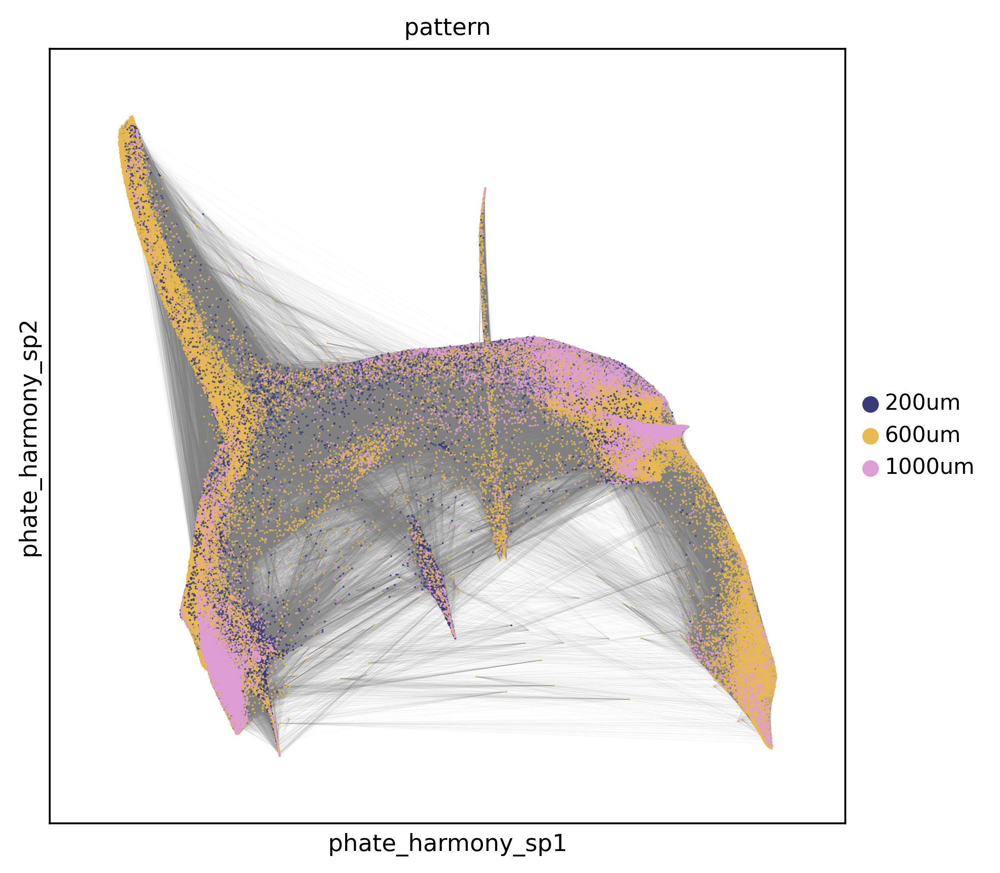

In [23]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_10_types','pattern'], 
    color=['pattern'],
    edges=True, edges_width=0.01, 
    # legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

#### DotPlot(s)

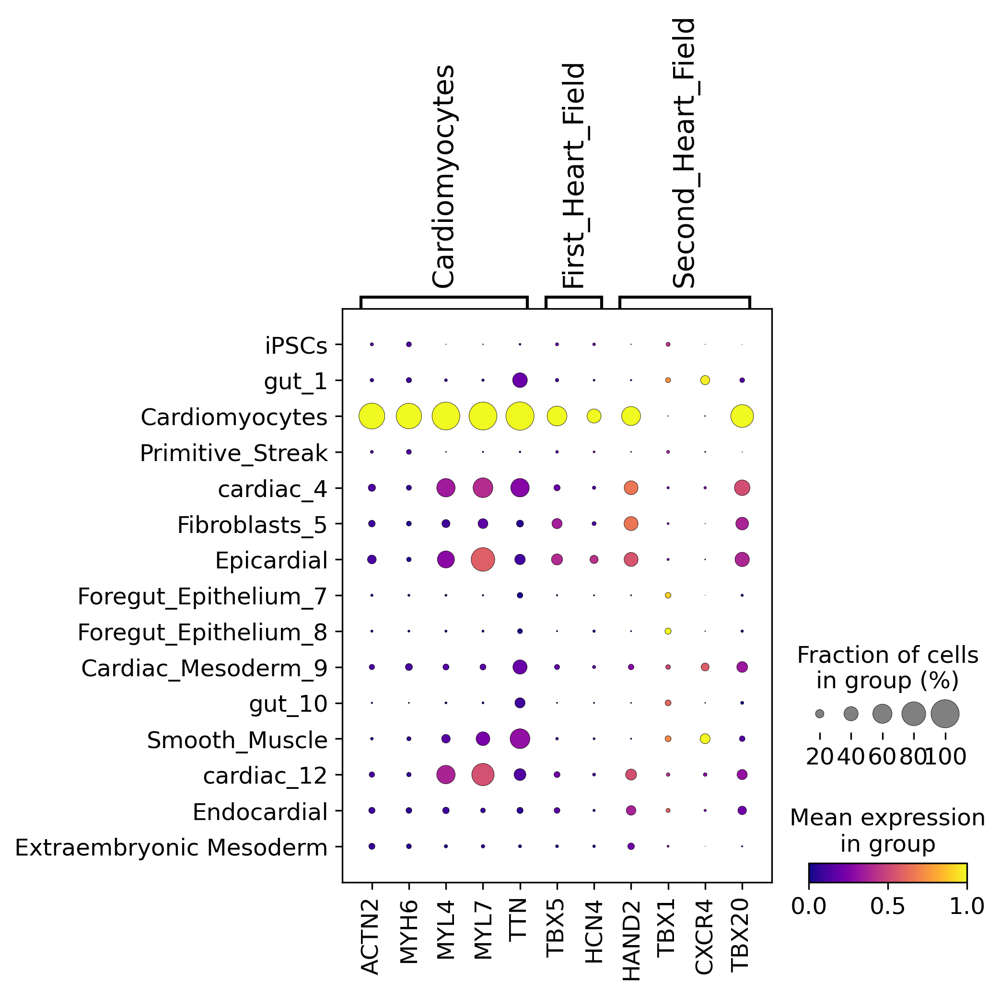

In [31]:
sc.set_figure_params(
    figsize=(6,6),
    dpi=150,
    transparent=True
)

#'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 
# 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver','Gut_Mesenchyme', 'Endoderm_Gut_Cells'
#'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 
# 'Endocardial', 'Epicardial', 
# 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'

tmp_cell_type=['Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field']

sc.pl.dotplot(
    adata,
    var_names={key:genes_dict[key] for key in tmp_cell_type},# title=tmp_cell_type,
    # var_names=genes_dict,
    groupby="leiden_harmony_sp_10_types",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=False
)

Label clusters using resolution value of 1.0

In [15]:
adata.obs['leiden_harmony_sp_10_types'].value_counts()

iPSCs                      12930
gut_1                      11104
Cardiomyocytes             10891
Primitive_Streak           10501
cardiac_4                   9186
Fibroblasts_5               8750
Epicardial                  6999
Foregut_Epithelium_7        5324
Foregut_Epithelium_8        4959
Cardiac_Mesoderm_9          4903
gut_10                      3213
Smooth_Muscle               2717
cardiac_12                  2536
Endocardial                 1234
Extraembryonic Mesoderm     1154
Name: leiden_harmony_sp_10_types, dtype: int64

In [152]:
old_to_new = {
    '0':'iPSCs',
    '1':'gut_1', 
    '2':'Cardiomyocytes', 
    '3':'Primitive_Streak', 
    '4':'cardiac_4',
    '5':'Fibroblasts_5', 
    '6':'Epicardial', 
    '7':'Foregut_Epithelium_7',
    '8':'Foregut_Epithelium_8', 
    '9':'Cardiac_Mesoderm_9', 
    '10':'gut_10',
    '11':'Smooth_Muscle', 
    '12':'cardiac_12', 
    '13':'Endocardial', 
    '14':'Extraembryonic Mesoderm'
}

adata.obs['leiden_harmony_sp_10_types'] = (
    adata.obs['leiden_harmony_sp_10'].map(old_to_new).astype('category')
)

# old_cluster_names = [
#     'Stromal (HAND1+)', # 0
#     'iPSCs_1', #1
#     'Mesendoderm_2', #2
#     'Posterior_Foregut_Liver_3', #3
#     'Gastr_Cells_Prim_Streak', #4
#     'Cardiomyocytes_5', #5
#     'Stromal_Smooth_Muscle_6', #6
#     'Cardiomyocytes_7', #7
#     'Cardiac_Mesoderm_8', #8
#     'Epicardial (SPARC+)', #9
#     'Stromal (ANKRD1+)', #10
#     'Posterior_Foregut_Liver_11', #11
#     'Endocardial_12', #12
#     'Posterior_Foregut_Liver_13', #13
#     'Unknown_14' #14
# ]

# old_to_new = {
#     '0':'Fibroblasts', # 0
#     '1':'iPSCs', #1
#     '2':'Definitive Endoderm', #2
#     '3':'Foregut Epithelium', #3
#     '4':'Primitive Streak', #4
#     '5':'Cardiomyocytes (late)', #5
#     '6':'Smooth Muscle', #6
#     '7':'Cardiomyocytes (early)', #7
#     '8':'Cardiac Mesoderm', #8
#     '9':'Epicardial', #9
#     '10':'Gut Mesenchyme', #10
#     '11':'Gut Mesenchyme', #11
#     '12':'Endocardial', #12
#     '13':'Liver Progenitors', #13
#     '14':'Extraembryonic Mesoderm' #14
# }

In [79]:
adata.obs['leiden_harmony_sp_10_types'].value_counts()

iPSCs                      12930
1                          11104
Cardiomyocytes             10891
Primitive_Streak           10501
4                           9186
Fibroblasts_5               8750
Epicardial                  6999
Foregut_Epithelium_7        5324
Foregut_Epithelium_8        4959
Cardiac_Mesoderm            4903
10                          3213
11                          2717
12                          2536
Endocardial                 1234
Extraembryonic Mesoderm     1154
Name: leiden_harmony_sp_10_types, dtype: int64

In [35]:
gc.collect()

3733306

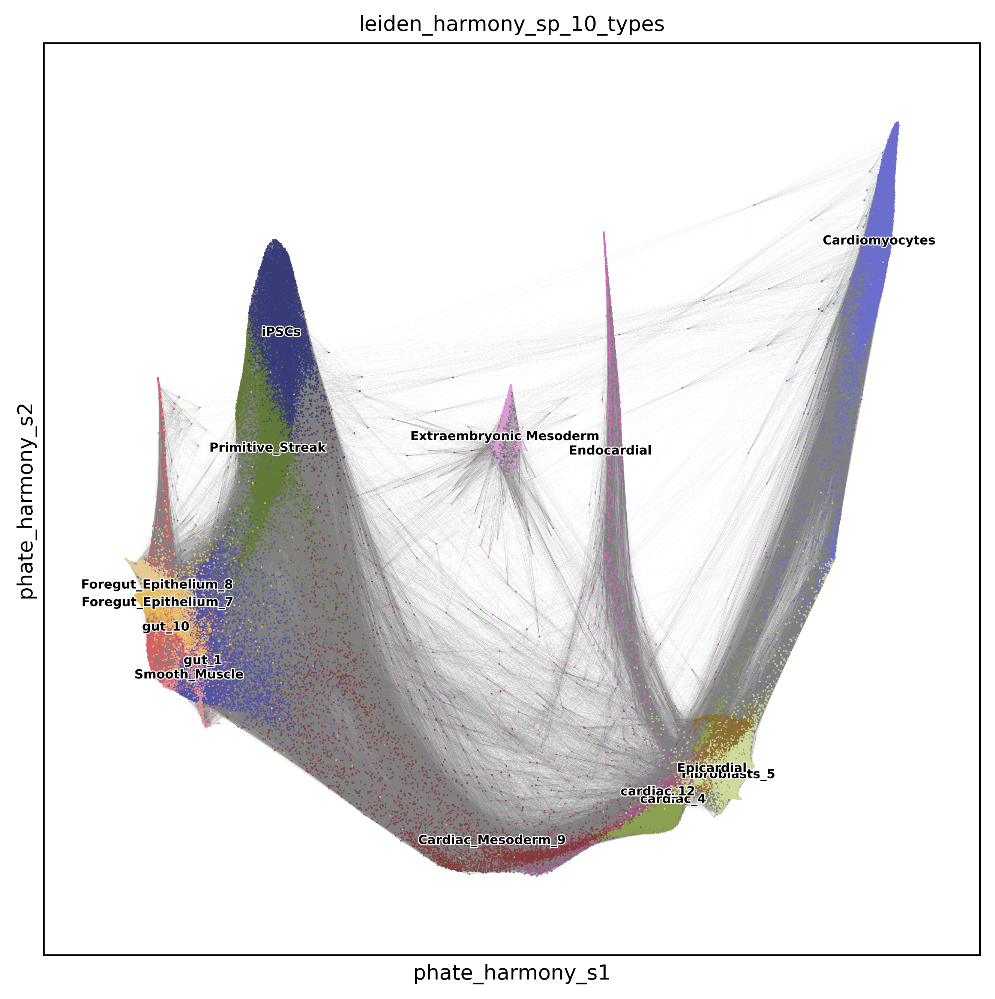

In [32]:
sc.set_figure_params(
    figsize=(8,8),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_s',
    color=['leiden_harmony_sp_10_types'], #,'pattern'
#     color=['leiden_harmony_types'],
    edges=True, edges_width=0.01,
    legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

## `harmony_s` embedding

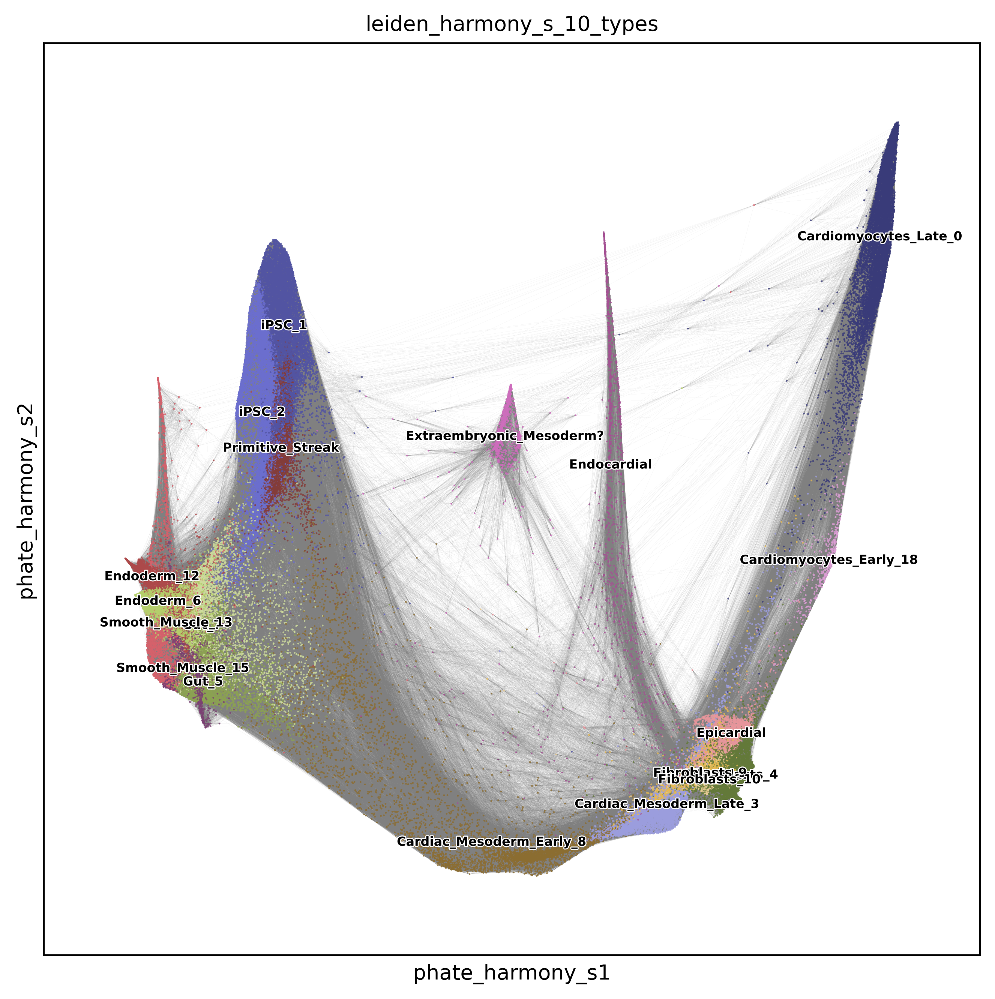

In [13]:
sc.set_figure_params(
    figsize=(8,8),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_s',
    color=['leiden_harmony_s_10_types'], #,'pattern'
#     color=['leiden_harmony_types'],
    edges=True, edges_width=0.01,
    legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

#### DotPlot(s)

categories: Cardiomyocytes_Late_0, iPSC_1, iPSC_2, etc.
var_group_labels: Endocardial, Epicardial


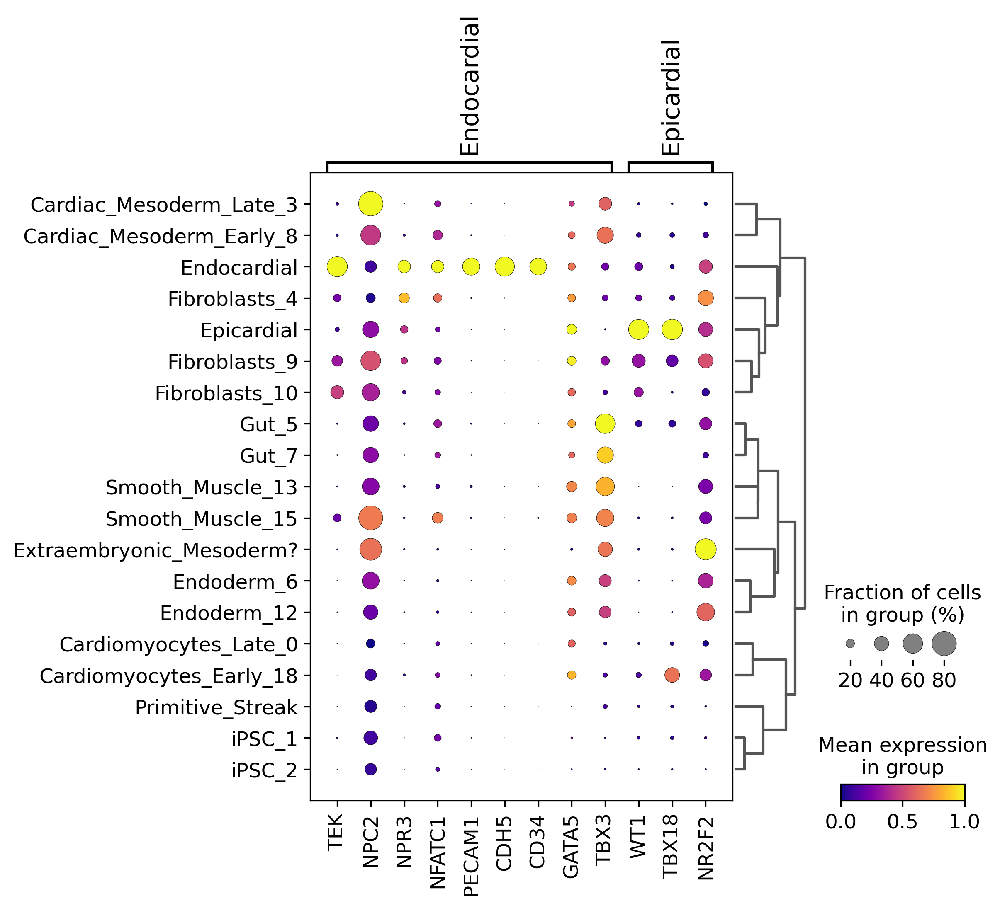

In [21]:
sc.set_figure_params(
#     figsize=(6,6),
    dpi=150,
    transparent=True
)

#'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 
# 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver', 'Gut_Mesenchyme', 'Endoderm_Gut_Cells',
#'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 
#'Endocardial', 'Epicardial', 
# 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'

tmp_cell_type=['Endocardial', 'Epicardial']

sc.pl.dotplot(
    adata,
    var_names={key:genes_dict[key] for key in tmp_cell_type},
    # var_names=genes_dict,
#     groupby='leiden_harmony_types', 
    groupby="leiden_harmony_s_10_types",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

In [137]:
old_to_new = {
    '0':'Cardiomyocytes_Late_0',
    '1':'iPSC_1', 
    '2':'iPSC_2', 
    '3':'Cardiac_Mesoderm_Late_3', 
    '4':'Fibroblasts_4',
    '5':'Gut_5', 
    '6':'Endoderm_6', 
    '7':'Gut_7',
    '8':'Cardiac_Mesoderm_Early_8', 
    '9':'Fibroblasts_9', 
    '10':'Fibroblasts_10',
    '11':'Primitive_Streak', 
    '12':'Endoderm_12', 
    '13':'Smooth_Muscle_13', 
    '14':'Epicardial',
    '15':'Smooth_Muscle_15',
    '16':'Endocardial',
    '17':'Extraembryonic_Mesoderm?',
    '18':'Cardiomyocytes_Early_18'
}

adata.obs['leiden_harmony_s_10_types'] = (
    adata.obs['leiden_harmony_s_10'].map(old_to_new).astype('category')
)

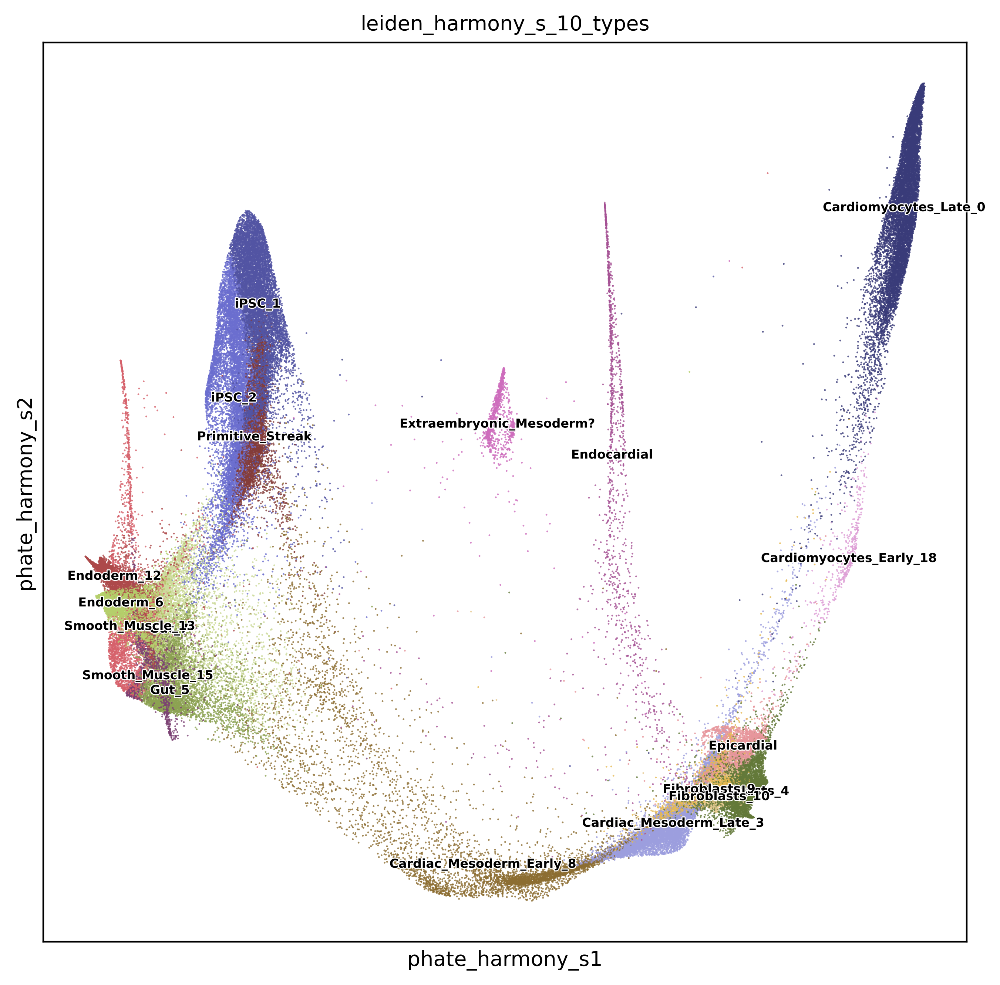

In [23]:
sc.set_figure_params(
    figsize=(8,8),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_s',
    color=['leiden_harmony_s_10_types'], 
    edges=False,
    edges_width=0.01,
    legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

# Cell type distributions

https://gist.github.com/wflynny/79c5266cc39a4a884958d696f84f85df

In [24]:
# import scanpy.api as sc
import matplotlib.pyplot as plt
import seaborn as sns

def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig

/tmp/ipykernel_2407/1323418318.py:25: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


ValueError: Invalid RGBA argument: 't'

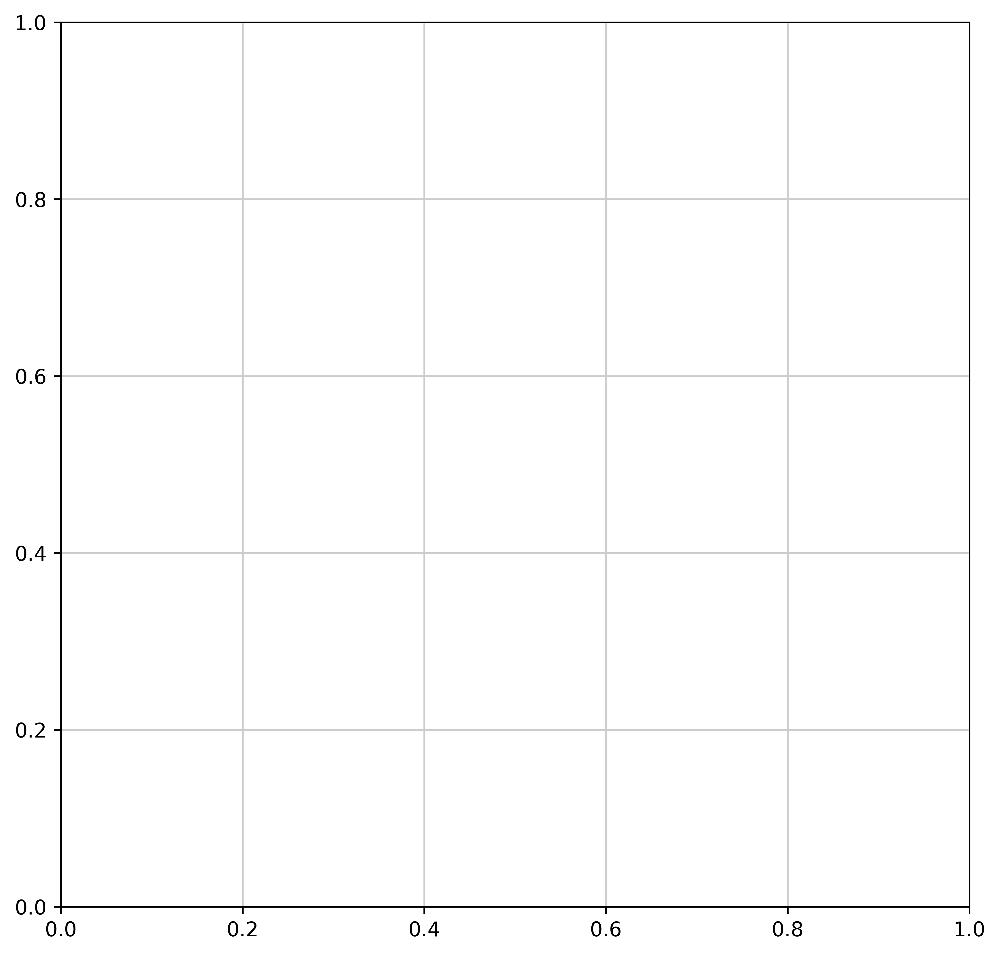

In [33]:
plot_cluster_proportions(
    get_cluster_proportions(
        adata[adata.obs["time_int"] == 4],
        cluster_key="leiden_harmony_s_10_types",
        sample_key="pattern",
        drop_values=None
    ),
    cluster_palette="tab20b",
    xlabel_rotation=90
)
gc.collect()

/tmp/ipykernel_2407/1323418318.py:25: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


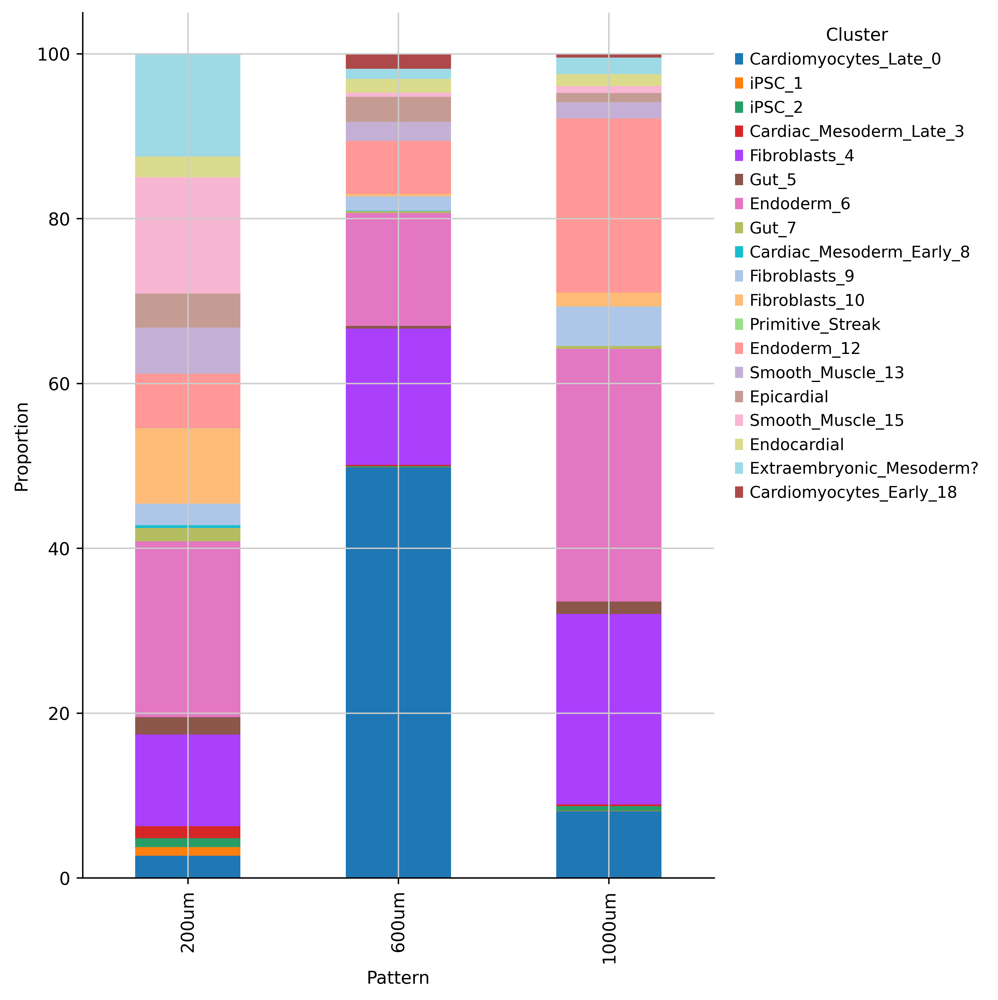

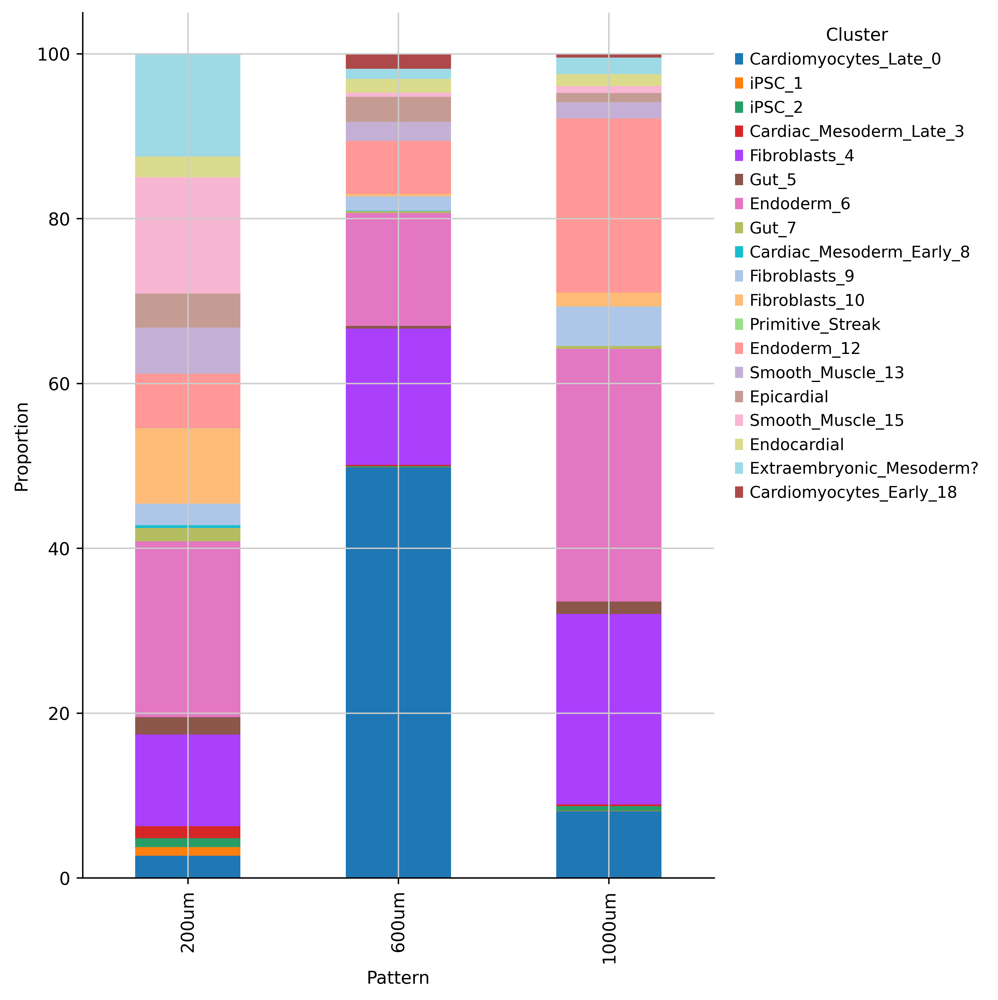

In [28]:
plot_cluster_proportions(
    get_cluster_proportions(
        adata[adata.obs["time_int"] == 21],
        cluster_key="leiden_harmony_s_10_types",
        sample_key="pattern",
        drop_values=None
    ),
    xlabel_rotation=90
)

In [17]:
plot_cluster_proportions(
    get_cluster_proportions(
        adata[adata.obs["pattern"] == "600um"],
        cluster_key="leiden_harmony_sp_10_types",
        sample_key="timepoint",
        drop_values=None
    ),
    xlabel_rotation=90
)

NameError: name 'plot_cluster_proportions' is not defined

# Save preprocessed object for future analyses (python & R)

In [156]:
# Save h5ad object for subsequent python analyses
adata.write("pyobjs/ma_iPSC_v6names.h5ad")

# Save Seurat compatible object for subsequent R analyses
#TODO
# https://mojaveazure.github.io/seurat-disk/articles/convert-anndata.html

In [5]:
# adata = sc.read_h5ad(
#     filename="/workdir/dwm269/scCardiacOrganoid/pyobjs/ma_iPSC_v6anno.h5ad"
# )

In [36]:
gc.collect()

0